In this notebook we comapre k-means clustering on CLIP embeddings of a dataset with k-means clustering on the raw pixel features of the images in the Bird dataset. <br>

We hypothesize that the clusters formed from the CLIP embeddings would represent higher semantic similarities pertaining to birds, e.g., similarity based on species, habitat, beak shape, size, etc. <br>

On the other hand, we expect the clusters formed from the raw pixel vectors to be grouped based on more high-level similarities in the features of the images, e.g., similiarity in the dominant colors of the images, the brightness in each image, etc. <br> 

(experimented by Dhanashree)

In [1]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from PIL import Image
import random

## Clustering of CLIP embeddings

In [2]:
# Load birds_emb. 
birds_emb = np.load('birds_emb.npy')

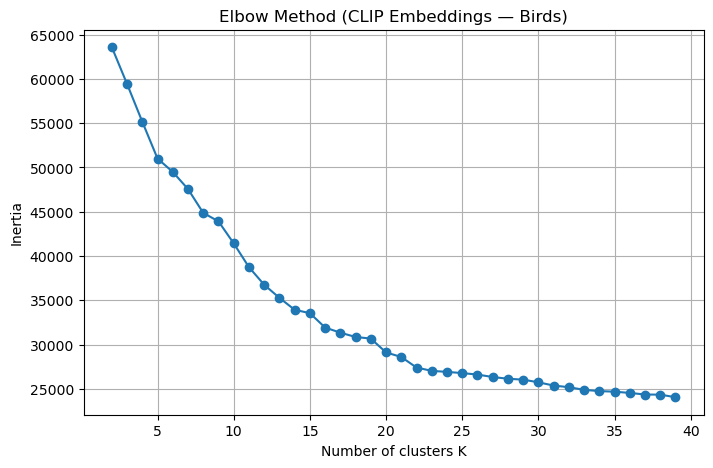

In [3]:
# Plotting Elbow curve to find a god estimate for number of clusters. 
inertias = [] # Sum of squared distances of each data point to its closest cluster center.
K_range = range(2, 40)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(birds_emb)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K_range, inertias, marker="o")
plt.title("Elbow Method (CLIP Embeddings — Birds)")
plt.xlabel("Number of clusters K")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

From this graph, we see that **20** is a good estimate for the number of clusters. 

## Carrying out K means for CLIP Space based on number of subfolders

In [4]:
# This dataset has 20 subfolders categorizing the data. We choose k to be the number of subfolders.
best_k_clip = 20

# Train k-means on CLIP embeddings.
kmeans_clip = KMeans(n_clusters=best_k_clip, random_state=0)
clip_clusters = kmeans_clip.fit_predict(birds_emb)

## Clustering for Pixel space 

In [5]:
# Same function as seen in the main notebook. 
def get_all_images_pathlib(root_folder):
    root_path = Path(root_folder)
    images = []
    
    for file_path in root_path.rglob('*'):
        if file_path.suffix.lower() == '.jpg':
            images.append(str(file_path))
    
    return images

In [6]:
base_dir = '/home/n2ortega/'
birds_folder = f'{base_dir}COGS118B_FinalProject/Birds'
birds = get_all_images_pathlib(birds_folder)
print(f"Found {len(birds)} images")

Found 333 images


In [7]:
def load_pixel_vectors(image_paths, size=(128,128)):
    pixel_vectors = []
    for p in image_paths:
        img = Image.open(p).convert("RGB").resize(size)
        arr = np.array(img).flatten()
        pixel_vectors.append(arr) # Add the vector for each image.
    return np.array(pixel_vectors)

pixel_data = load_pixel_vectors(birds) # This contains the pixel data for the Birds images. 
print("Pixel data shape:", pixel_data.shape)

Pixel data shape: (333, 49152)


In [8]:
# Reduce the dimentionality of the pixel features using PCA.
# WHY IS THIS IMPORTANT? -> Makes the clusters more stable.
# The sklearn documentation also mentions that for very high dimensionality, k-means performance is impacted. 
# We do not resize to a very small size to preserve the details of the image. 

pca_pixels = PCA(n_components = 50)   
pixel_pcs = pca_pixels.fit_transform(pixel_data)

print("PCA pixel feature shape:", pixel_pcs.shape)

PCA pixel feature shape: (333, 50)


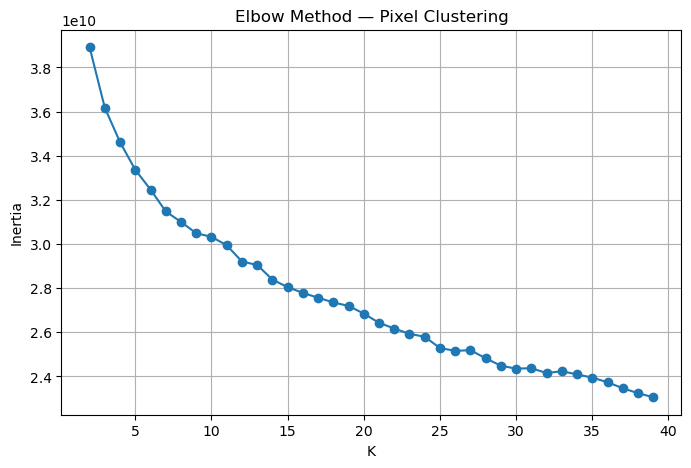

In [9]:
# Plot the elbow curve
# Similar to what we did earlier.

K_range = range(2, 40)
inertias = []

for k in K_range:
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(pixel_pcs)
    inertias.append(km.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K_range, inertias, marker='o')
plt.title("Elbow Method — Pixel Clustering")
plt.xlabel("K")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

##### From this graph we see that about **16** is a good estimate for the number of clusters. 

## Carrying out K means for Pixel Space based on number of subfolders

In [10]:
# This dataset has 17 subfolders categorizing the data. We choose k to be the number of subfolders.
best_k_pixel = 17

# Train k-means on pixel data.
kmeans_pixel = KMeans(n_clusters=best_k_pixel, random_state=0)
pixel_clusters = kmeans_pixel.fit_predict(pixel_data)

## Display Cluster Samples

In [11]:
# We would like to see how the bird images were grouped differently.
# To do this we define a function which lets us display "n" number of images from a cluster of or choice.
# We refer to a cluster by its number. 

In [12]:
def show_cluster_samples(image_paths, labels, cluster_id, n=16):
    
    idx = [i for i in range(len(labels)) if labels[i] == cluster_id] # Get the indexes of images in a cluster. 
    # Here label is the cluster number assigned to an image. 
    # cluster_id is the cluster we want to look into. 
    # This works because CLIP embeddings retain the original ordering of images. So we can correlate this to the original images. 
    
    if len(idx) == 0: 
        print("cluster empty") # If we try to check a cluster that doesn't exist.
        return
    
    sample = random.sample(idx, min(n, len(idx))) # Randomly selecting indexes of images in a cluster.

    # Set style specifics for the plot of images. 
    cols = 4  
    rows = (len(sample) + cols - 1) // cols 
    plt.figure(figsize=(10, 10))
    
    for j, i in enumerate(sample):
        img = Image.open(image_paths[i]).convert("RGB")
        ax = plt.subplot(rows, cols, j+1)
        plt.imshow(img) # Display the images. 
        plt.axis("off")
    plt.tight_layout()
    plt.show()

CLIP cluster:


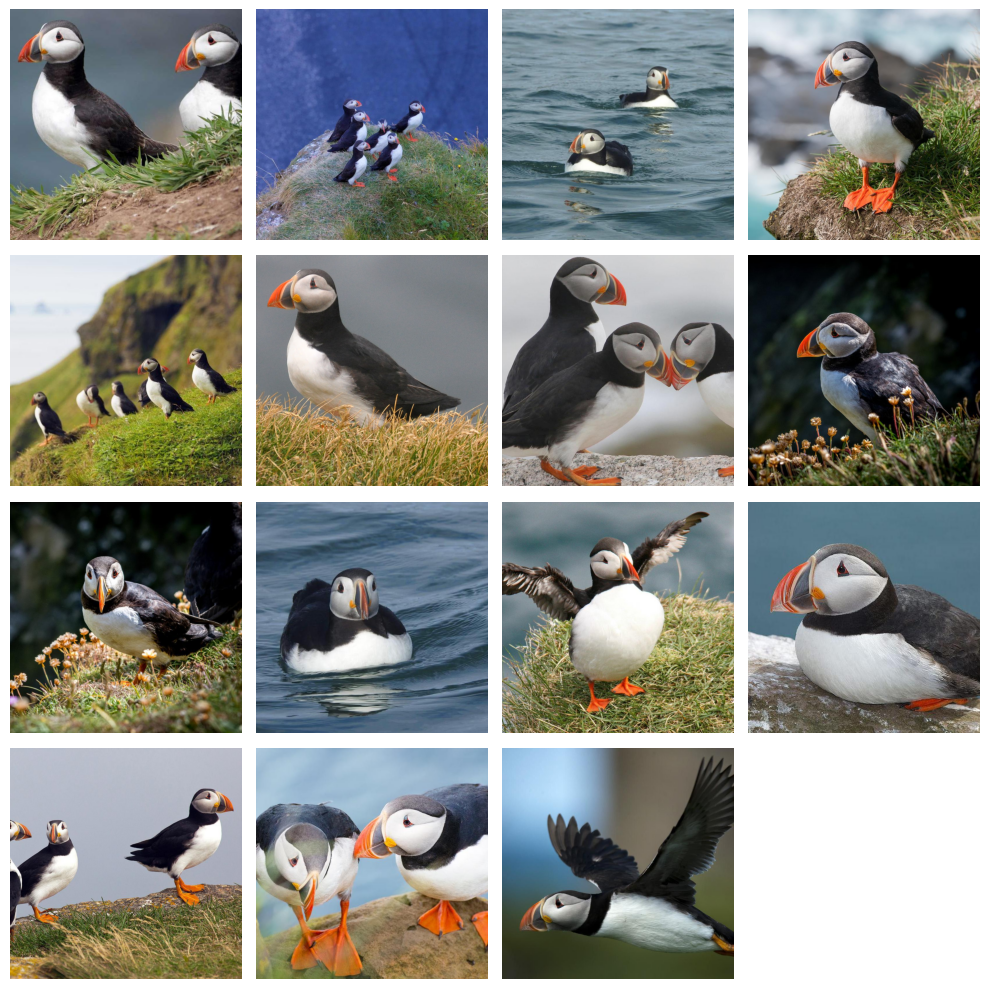

Pixel cluster:


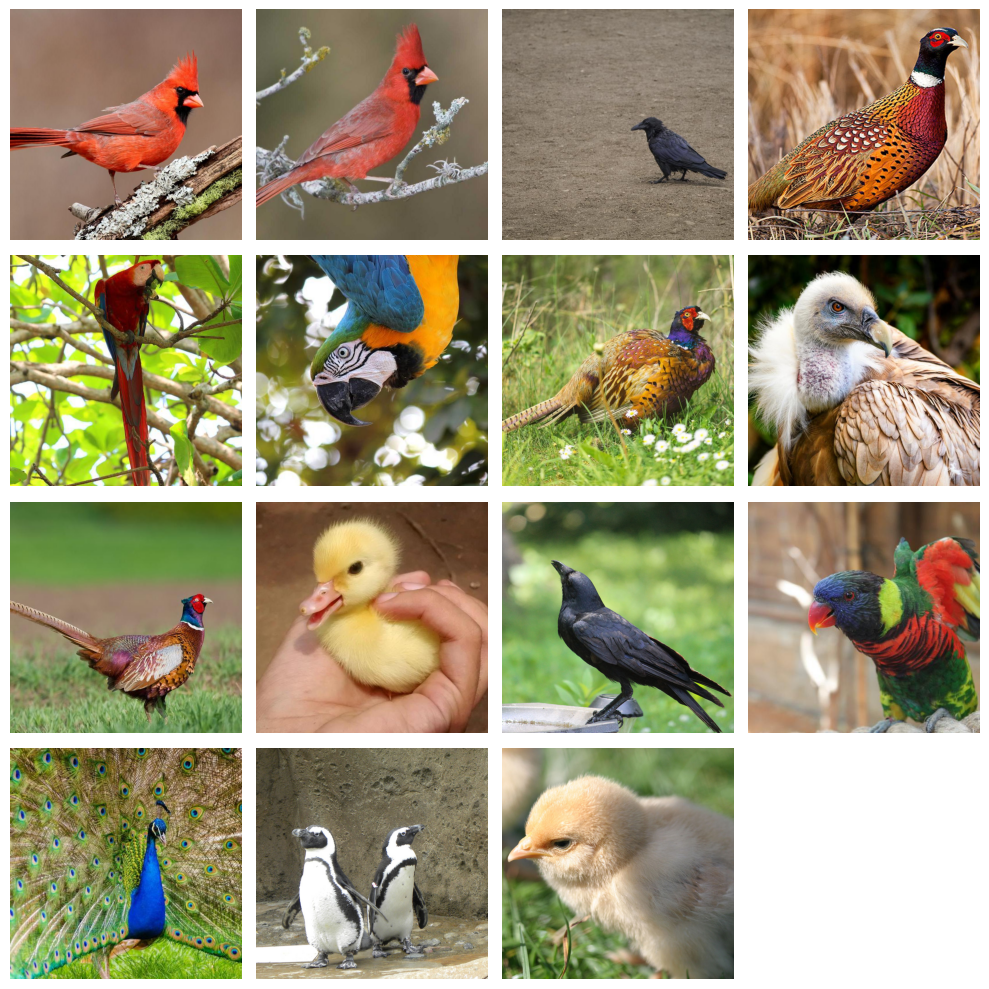

In [13]:
# example clusters
clip_k = 10      # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 9    # Pick any valid cluster number from pixel clusters (1 to 16).

print("CLIP cluster:")
show_cluster_samples(birds, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(birds, pixel_clusters, pixel_k, n=15)


CLIP cluster:


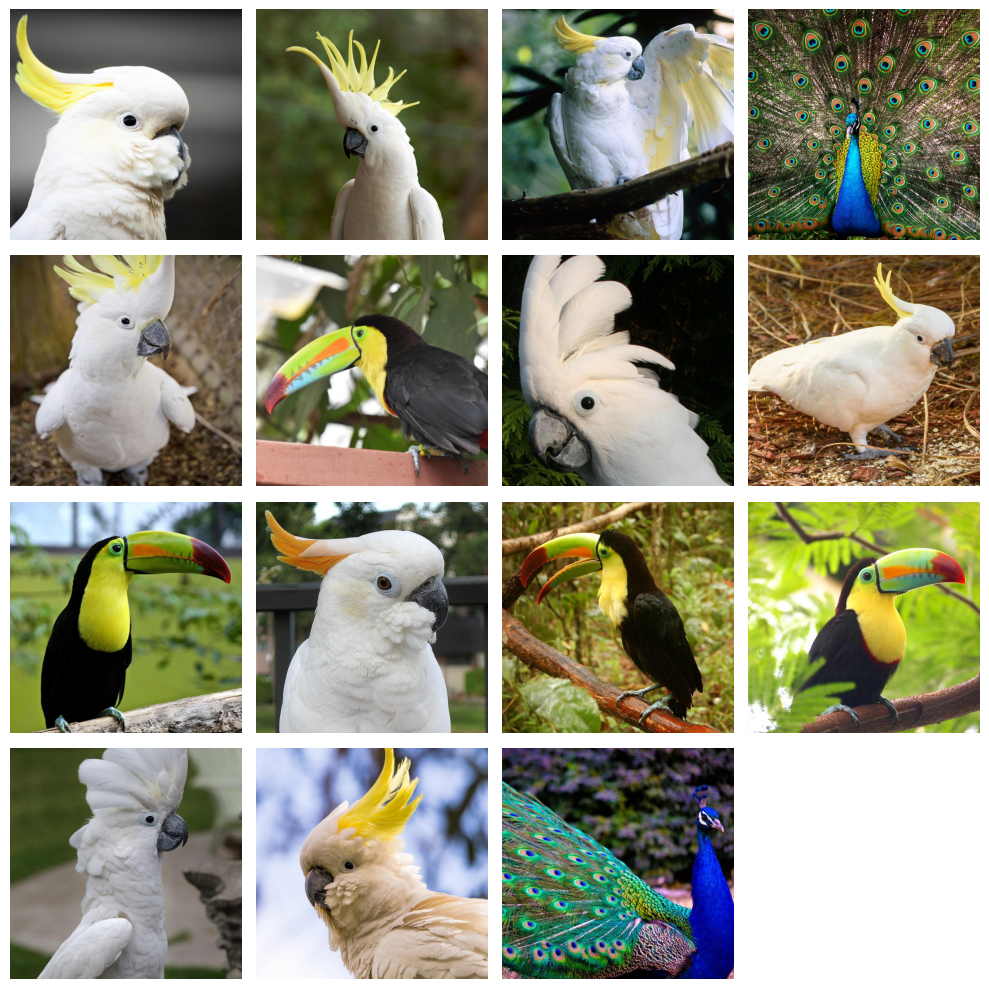

Pixel cluster:


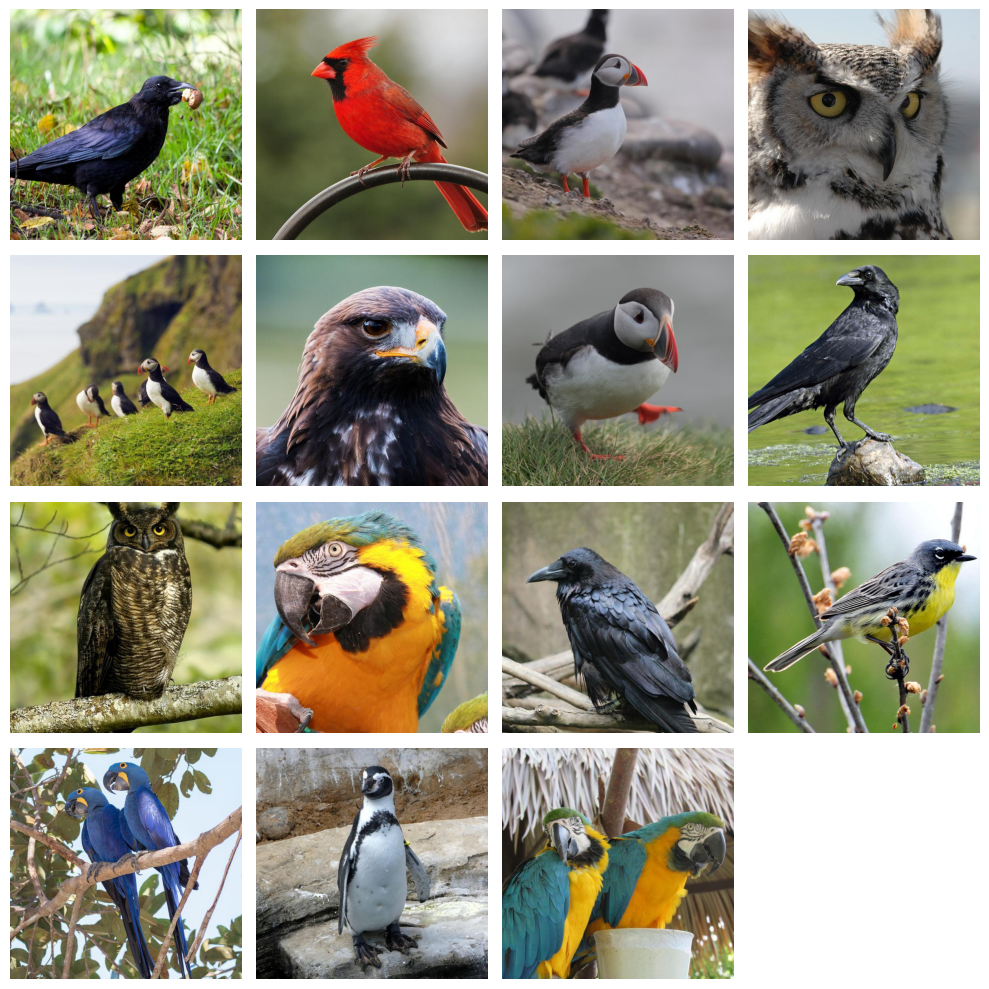

In [24]:
# example clusters
clip_k = 5      # Pick any valid cluster number from clip clusters.
pixel_k = 7    # Pick any valid cluster number from pixel clusters.

print("CLIP cluster:")
show_cluster_samples(birds, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(birds, pixel_clusters, pixel_k, n=15)


CLIP cluster:


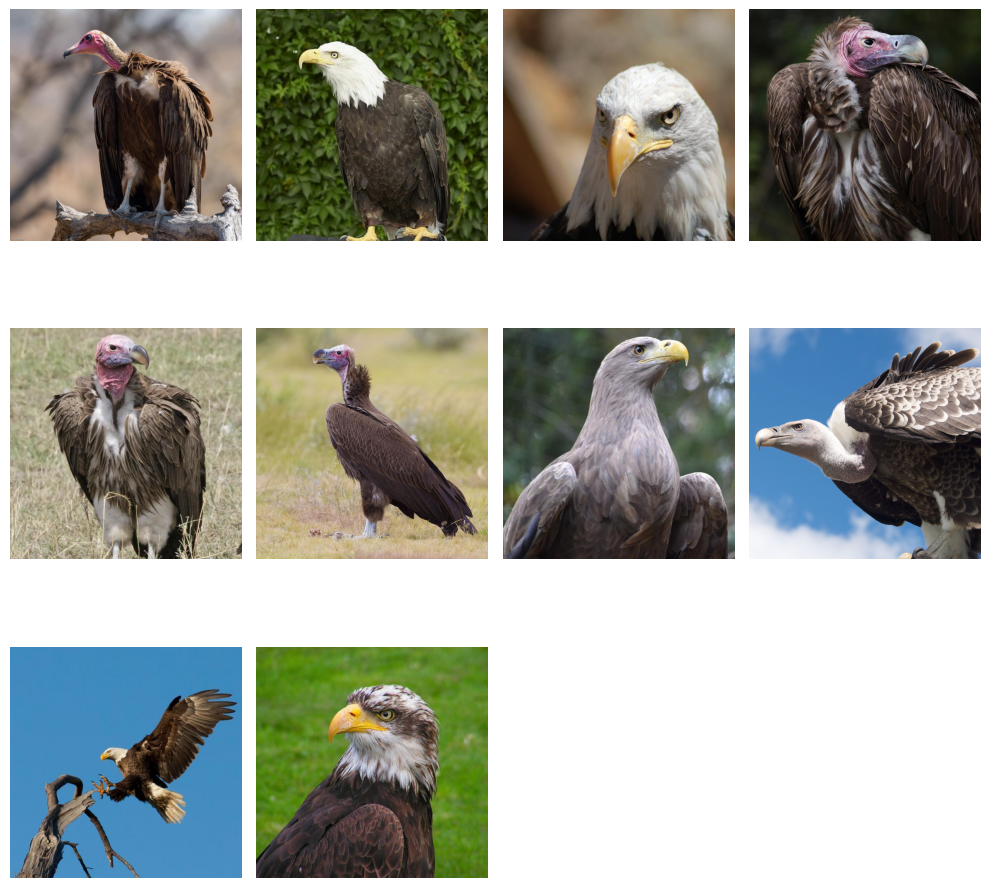

Pixel cluster:


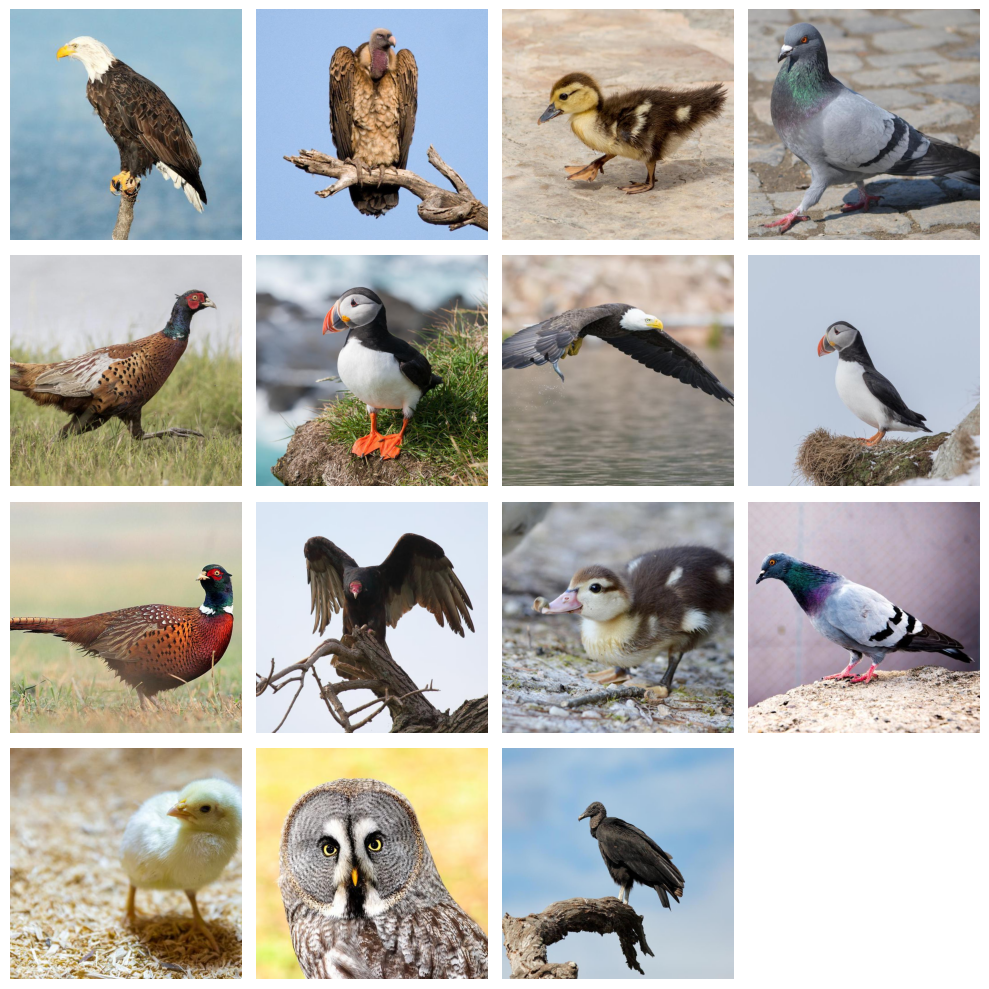

In [25]:
# example clusters
clip_k = 18     # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 3    # Pick any valid cluster number from pixel clusters (1 to 10).

print("CLIP cluster:")
show_cluster_samples(birds, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(birds, pixel_clusters, pixel_k, n=15)


CLIP cluster:


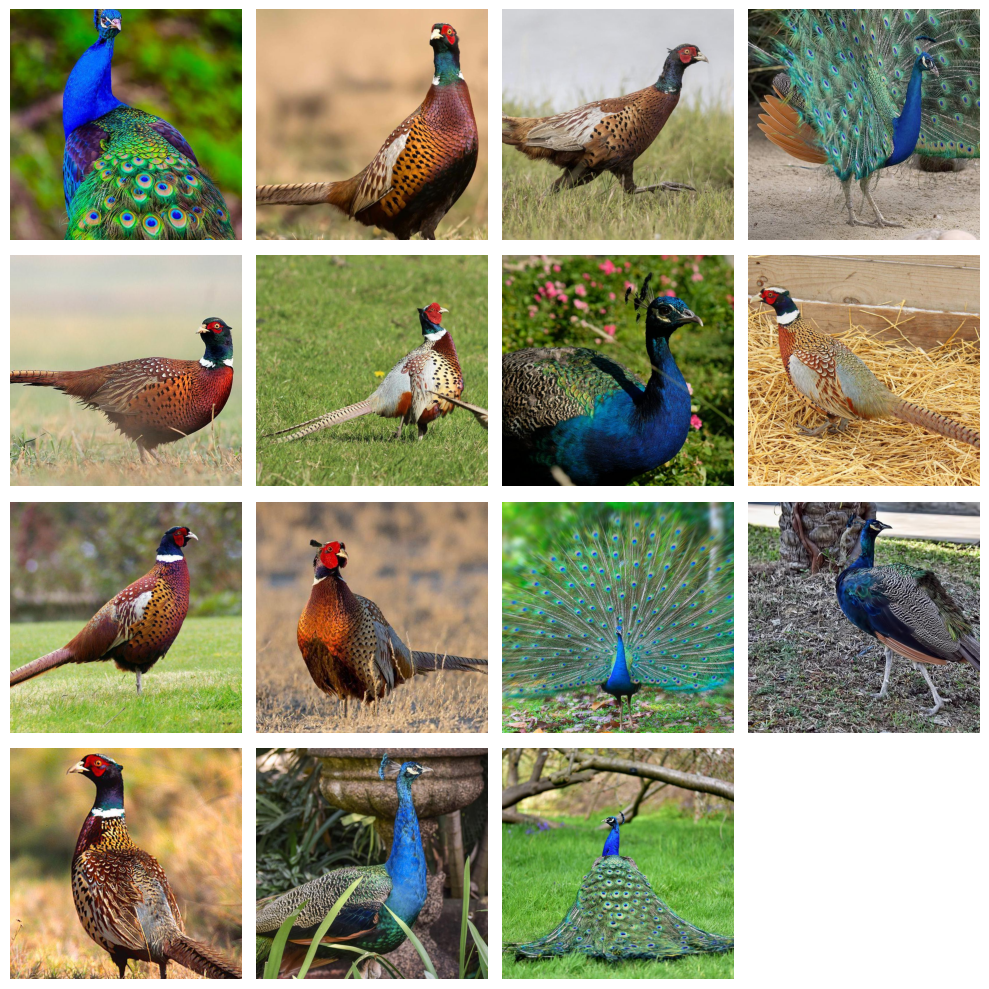

Pixel cluster:


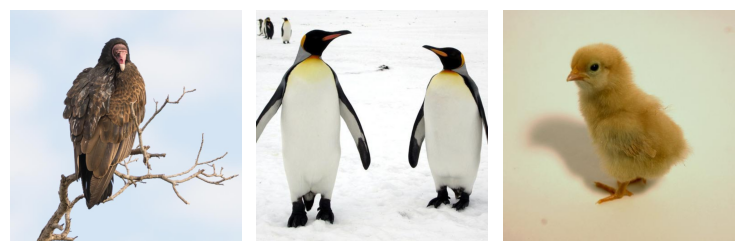

In [26]:
# example clusters
clip_k = 7    # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 15    # Pick any valid cluster number from pixel clusters (1 to 10).

print("CLIP cluster:")
show_cluster_samples(birds, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(birds, pixel_clusters, pixel_k, n=15)


## Displaying the mean image of each cluster in both spaces

In [11]:
#Using starter code to set up StableUnCLIP in this notebook
#the same way as in the PCAperturbation notebooks

In [14]:
import requests
import torch
print(f"Memory allocated: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB")
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
import numpy as np
from tqdm import tqdm
import pandas as pd
import numpy as np
import os
from sklearn.decomposition import PCA
import matplotlib.gridspec as gridspec

from diffusers import StableUnCLIPImg2ImgPipeline
from transformers import CLIPTextModelWithProjection, CLIPTokenizer

Memory allocated: 0.00 GB


2025-12-09 21:48:15.219089: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-09 21:48:15.219136: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-09 21:48:15.220596: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-09 21:48:15.229222: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [15]:
tqdm._instances.clear()

In [16]:
# Code for when GPU throws OOM error
torch.cuda.empty_cache()

try:
    del pipe
except:
    pass

try:
    del recon_pipe
except:
    pass

# Check whats left -- should see 0
print(f"Memory allocated: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB")
print(f"Memory reserved: {torch.cuda.memory_reserved(0) / 1e9:.2f} GB")

Memory allocated: 0.00 GB
Memory reserved: 0.00 GB


In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [18]:
recon_pipe = StableUnCLIPImg2ImgPipeline.from_pretrained(
    "sd2-community/stable-diffusion-2-1-unclip", torch_dtype=torch.float32
)

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

In [29]:
def reconstruct_image_from_embedding(recon_pipe, embedding):
    emb_tensor = torch.from_numpy(embedding).unsqueeze(0).to(
        device=recon_pipe.device, 
        dtype=recon_pipe.image_encoder.dtype
    )
    return recon_pipe(image_embeds=emb_tensor).images[0]

In [30]:
# a function to visualize centroids
def show_all_centroid_images(centroids, cols, mode = 'auto'):
   
    #auto mode will use the dimensions of the centroids to determine whether it is pixel or CLIP
    if mode == 'auto':
        d = centroids.shape[1]
        if d == 1024:
            mode = 'CLIP'
        elif d == 49152:
            mode = 'pixel'
        else:
            raise ValueError (f"Cannot auto-detect mode for dimension {d}")
            
    num = len(centroids)
    rows = (num + cols - 1) // cols

    plt.figure(figsize = (cols * 3, rows * 3))
    
    for i, c in enumerate(centroids):

        #CLIP centroid image reconstruction
        if mode == 'CLIP':
            img = reconstruct_image_from_embedding(recon_pipe, c)

        #pixel centroid image reconstruction
        elif mode == 'pixel':
            img = c.reshape(128,128,3)
            img = np.clip(img, 0, 255).astype(np.uint8)
            img = Image.fromarray(img)
        plt.subplot(rows,cols, i + 1)
        plt.imshow(img)
        plt.title(f'C{i}')
        plt.axis('off')

    plt.suptitle('Mean images of all 45 CLIP clusters')
    plt.tight_layout()
    plt.show()

In [28]:
#CLIP space
clipcentroids = kmeans_clip.cluster_centers_
show_all_centroid_images(clipcentroids, cols = 8)

  0%|          | 0/21 [00:00<?, ?it/s]

KeyboardInterrupt: 

<Figure size 2400x900 with 0 Axes>

In [ ]:
#Pixel space
pixelcentroids = pca_pixels.inverse_transform(kmeans_pixel.cluster_centers_)
show_all_centroid_images(pixelcentroids, cols = 8)
#show_all_centroid_images(pixelcentroids, cols = 8)

## Observations

We looked at several clusters from both the CLIP‑based clustering and the pixel‑based clustering to see how the images were grouped. We have displayed 4 such cluster pairs above. <br>
Overall, the CLIP clusters grouped together birds that looked similar in terms of species and shape. <br>
In contrast, the pixel clusters grouped images more randomly with a variety of birds being grouped together. The images could be similar on more hgih-level features of the images like the most dominant colors in them or the lighting and brightness in the images. <br>
It appears that CLIP clustering captured more meaningful bird similarities, while pixel clustering was mostly influenced by low‑level visual details.